# Data Science Master Module 1 – Case Study
## Data Science Master 2022/2023
## Prof. Dr. Gottfried Vossen
### Student: Jan Hümmelink, 21.01.2023

### Links
Provided by the case study document:
1. https://www.uber.com/en-DE/blog/uber-data-platform-2019/
2. https://towardsdatascience.com/how-does-uber-use-clustering-43b21e3e6b7d
3. https://www.codespeedy.com/analyse-uber-data-in-python-using-machine-learning/   
4. https://www.kaggle.com/datasets/fivethirtyeight/uber-pickups-in-new-york-city alternative Datasets at
  https://developer.uber.com/docs/businesses/data‐automation/data‐download or https://data.world/datasets/uber)

Additional links:
1. https://geopandas.org/en/stable/getting_started/introduction.html - working with geolocation, extending pandas datastructures
2. https://routingpy.readthedocs.io/en/latest/ in combination with https://openrouteservice.org - routing between locations, works with free openrouteservice
3. https://data.world/city-of-ny/d3c5-ddgc - provides taxi zone lookup and a geometrical definition of the taxi zones

# Basics
## Setting up python environment

In [17]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import plotly.express as px
import geopandas as gpd
from shapely import wkt
from shapely.geometry import Point
from routingpy import ORS
from pprint import pprint

## Import and explore data

In [18]:
data = pd.read_csv('archive/uber-raw-data-apr14.csv')
data.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [19]:
data15 = pd.read_csv('archive/uber-raw-data-janjune-15.csv')
data15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


## Locating the data points
The first approach is to check whether the bases are suitable for grouping the rides and then adjust the prices per base. The diagram below shows, that the bases sometimes have a certain area they cover up, but that is not distinct. So for a given location it is not clear which base will organize the pickup. Because of that this approach is not suitable to group tha data. 

In [20]:
sct = px.scatter(data, y='Lat' ,x='Lon',color='Base')
sct.show()

Second approach: boroughs
- boroughs are distinct
- boroughs have different purposes (some with a business focus, some for living, some with a travelling focus airports etc.) so they have different usage profiles for uber rides

In [21]:
taxizones = pd.read_csv('archive/taxi-zone-lookup.csv')
taxizones

,LocationID,Borough,Zone
0,1,EWR,Newark Airport
1,2,Queens,Jamaica Bay
2,3,Bronx,Allerton/Pelham Gardens
3,4,Manhattan,Alphabet City
4,5,Staten Island,Arden Heights
...,...,...,...
260,261,Manhattan,World Trade Center
261,262,Manhattan,Yorkville East
262,263,Manhattan,Yorkville West
263,264,Unknown,Unknown


check the joined data for null values:

In [22]:
joined_data = data15.join(taxizones.set_index('LocationID'),on='locationID')
joined_data.isnull().sum()

Dispatching_base_num         0
Pickup_date                  0
Affiliated_base_num     162195
locationID                   0
Borough                      0
Zone                         0
dtype: int64

For the further analysis just the pickup dates and boroughs are interesting. The date must be converted to a datetime.

In [23]:
joined_data = joined_data[['Pickup_date','Borough']]
joined_data['Pickup_date'] = pd.to_datetime(joined_data['Pickup_date'])
joined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14270479 entries, 0 to 14270478
Data columns (total 2 columns):
 #   Column       Dtype         
---  ------       -----         
 0   Pickup_date  datetime64[ns]
 1   Borough      object        
dtypes: datetime64[ns](1), object(1)
memory usage: 217.8+ MB


Add a line for each hour of each day per borough and count the pickups in that group.

In [24]:
pickups = joined_data.groupby('Borough').resample('H', on='Pickup_date').count().rename(columns={'Borough':'count', 'Pickup_date':'count2'}).reset_index()
del pickups['count2']
pickups

,Borough,Pickup_date,count
0,Bronx,2015-01-01 00:00:00,144
1,Bronx,2015-01-01 01:00:00,122
2,Bronx,2015-01-01 02:00:00,136
3,Bronx,2015-01-01 03:00:00,134
4,Bronx,2015-01-01 04:00:00,104
...,...,...,...
30337,Unknown,2015-06-30 19:00:00,3
30338,Unknown,2015-06-30 20:00:00,3
30339,Unknown,2015-06-30 21:00:00,0
30340,Unknown,2015-06-30 22:00:00,2


Added a column day of week to find differences between the days.

In [25]:
pickups["dayofweek"] = pickups["Pickup_date"].dt.dayofweek
pickups

,Borough,Pickup_date,count,dayofweek
0,Bronx,2015-01-01 00:00:00,144,3
1,Bronx,2015-01-01 01:00:00,122,3
2,Bronx,2015-01-01 02:00:00,136,3
3,Bronx,2015-01-01 03:00:00,134,3
4,Bronx,2015-01-01 04:00:00,104,3
...,...,...,...,...
30337,Unknown,2015-06-30 19:00:00,3,1
30338,Unknown,2015-06-30 20:00:00,3,1
30339,Unknown,2015-06-30 21:00:00,0,1
30340,Unknown,2015-06-30 22:00:00,2,1


The goal is finding criteria which are suitable to influence the price. The first analyzed criterion is the borough.

In [26]:
px.line(pickups, x="Pickup_date", y="count", color='Borough')

The diagram shows clearly that different boroughs are different popular. Manhatten is the borough with the most request so it should be the most expensive borough.
The next diagram shows the influence of the hour of the day to the demand grouped by the different boroughs.

In [27]:
joined_data["dayofweek"]=joined_data["Pickup_date"].dt.dayofweek
pickups_by_day_of_week = joined_data.groupby(['dayofweek','Borough']).resample('H', on='Pickup_date').count().rename(columns={'Borough':'count'})
del pickups_by_day_of_week['Pickup_date']
del pickups_by_day_of_week['dayofweek']
pickups_by_day_of_week=pickups_by_day_of_week.reset_index()
px.histogram(pickups_by_day_of_week, x="dayofweek", y="count", color='Borough')

Here we can see that the assumption is true that there is a different usaga of uber per day of week. So the criterion day of week is suitable to influence the pricing model. Next the influence of the time of day will be analyzed.

In [28]:
joined_data["hour"]=joined_data["Pickup_date"].dt.hour
joined_data["dayofweek"]=joined_data["Pickup_date"].dt.dayofweek
pickups_by_hour = joined_data.groupby(['hour','Borough','dayofweek']).count().rename(columns={'Pickup_date':'count'})
pickups_by_hour=pickups_by_hour.reset_index()

pickups_by_hour

,hour,Borough,dayofweek,count
0,0,Bronx,0,1179
1,0,Bronx,1,651
2,0,Bronx,2,800
3,0,Bronx,3,924
4,0,Bronx,4,991
...,...,...,...,...
1074,23,Unknown,2,36
1075,23,Unknown,3,44
1076,23,Unknown,4,70
1077,23,Unknown,5,83


In [29]:
px.histogram(pickups_by_hour, x="hour", y="count", color="dayofweek")

In [30]:
px.histogram(pickups_by_hour, x="hour", y="count", color="Borough")

Here we can see, that different boroughs use uber at different times and it depends on the day of week combined with the time whether uber is used frequently.

## Ideas for calculating the price per minute
all of the following ideas are based on the borough and day of week and the hour of day of the requested ride
- price should increase/decrease when the borough is more/less requested than other boroughs in te requested timeslot
- price should increase/decrease when the borough is at that time usually more/less requested than an average hour in that borough on that day

Of course the price is influenced by the distance to cover the gas for the vehicle and by the time the ride will take to include the drivers wage in the pricing model.
So we need to determine the distance and time.

In [31]:
def get_route_data(startloc:Point, destinationloc:Point):
    apikey = pd.read_csv("archive/apikey.csv")['apikey'][0]

    client = ORS(api_key=apikey)
    route = client.directions(
        locations = [[startloc.x, startloc.y], [destinationloc.x,destinationloc.y]],
        profile='driving-car',
        units = "m"

    )
    return {"distance": route.distance/1000, "duration":route.duration/60} # transformation to kilometres and minutes

get_route_data(Point(7.61202, 51.97416), Point(7.61918, 51.96571))

{'distance': 1.353, 'duration': 3.6666666666666665}

For calculating the other factors per borough we need to be able to map a location (coordinates) to a borough.

<AxesSubplot:>

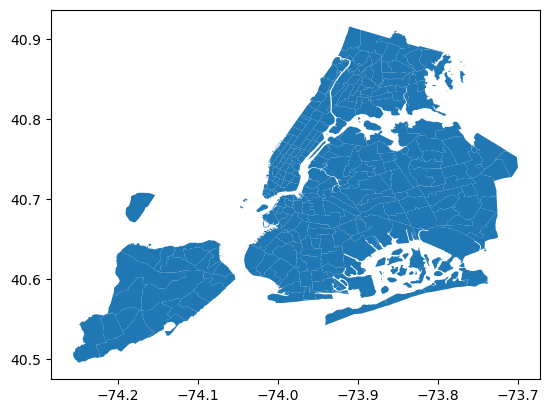

In [32]:
gpdtaxi = pd.read_csv("archive/taxi_zones.csv")
gpdtaxi["geometry"] = gpdtaxi.the_geom.apply(wkt.loads)
gpdtaxi.drop("the_geom", axis=1, inplace=True)
gpdtaxi = gpd.GeoDataFrame(gpdtaxi, geometry='geometry')
gpdtaxi.plot()

In [33]:
def get_borough_by_location(location:Point):
    joindf = gpdtaxi[gpdtaxi.contains(location)]
    return joindf.reset_index().borough[0]

get_borough_by_location(Point(-73.9,40.7))

'Queens'

# Task 1: develop a simple pricing model
Finally all the factors are fitted into a pricing model. The base price per kilometre is 0.7 USD and one minute of the ride costs 1 USD. The factors for the borough ranking and the hourly demand should only apply to the minute price to reduce the influence of the factors a bit.

In [34]:
def determine_price(requested_date, startlocation:Point, destination:Point, silent:bool):
    requested_date = pd.to_datetime(requested_date)
    base_factor = 1
            
    # determine the borough of the location
    borough = get_borough_by_location(startlocation)
        
    # determine ranking of the boroughs
    data_rank = pickups_by_hour.loc[(pickups_by_hour['dayofweek'] == requested_date.dayofweek) & (pickups_by_hour['hour'] == requested_date.hour)].copy()
    data_rank['rank'] = data_rank.loc[:,'count'].rank()

    # calculating rank factor
    rank = data_rank.loc[data_rank["Borough"]==borough].reset_index().loc[0,"rank"]
    max_rank = data_rank["rank"].max()
    rank_factor = base_factor * (1+(rank/max_rank)) # maximum of rank factor is 2
    
    # determine time factor 
    mean_pickups_per_hour = pickups_by_hour.loc[(pickups_by_hour["Borough"]==borough) & (pickups_by_hour["dayofweek"] == requested_date.dayofweek)]['count'].mean()
        
    pickups_requested_hour = pickups_by_hour.loc[(pickups_by_hour["Borough"]==borough) & (pickups_by_hour["dayofweek"] == requested_date.dayofweek) & (pickups_by_hour["hour"] == requested_date.hour)]['count'].mean()
    
    time_factor = base_factor*(pickups_requested_hour/mean_pickups_per_hour)
    
    final_factor = rank_factor*time_factor
    
    route = get_route_data(startlocation, destination)
    distance = route["distance"]
    

    duration = route["duration"]
    

    price_per_km = 0.7
    price_per_minute = 1*final_factor

    price = distance*price_per_km + duration*price_per_minute
    if silent != True:
        print("base factor: "+str(base_factor))
        print("borough: "+ borough)
        print("rank: "+ str(rank)+" max_rank: "+str(max_rank) + " rank_factor: "+str(rank_factor))
        print("mean_pickups_per_hour: " + str(mean_pickups_per_hour))
        print("pickups_requested_hour: "+ str(pickups_requested_hour))
        print("time_factor: "+ str(time_factor))
        print("final factor "+str(final_factor))
        print("distance "+str(distance))
        print("duration "+str(duration))
        print("final price: "+str(price))
    return price

determine_price("2022-05-01 13:45", Point(-73.8,40.7), Point(-73.8,40.75), False)

base factor: 1
borough: Queens
rank: 5.0 max_rank: 7.0 rank_factor: 1.7142857142857144
mean_pickups_per_hour: 9184.625
pickups_requested_hour: 9752.0
time_factor: 1.061774432815711
final factor 1.8201847419697905
distance 6.928
duration 13.35
final price: 29.149066305296703


29.149066305296703

# Task 2: write a simple recommender system
To give the user the cheapest option for the ride on the selected date, all possible options per day are analyzed and the cheapest option will be suggested to the user.

In [35]:
def recommend_cheapest_time(startloc:Point, destination:Point, date:str):
    datetimes = []
    prices = []
    for i in range(24):
        datetime = "{} {}:00".format(date,i)
        price = determine_price(datetime, startloc, destination, True)
        datetimes.append(datetime)
        prices.append(price)
    dict = {"time": datetimes, "price":prices}
    df = pd.DataFrame(dict)
    print(df)
    print("cheapest time and price :" + str(df[df.price == df.price.min()]))
    

recommend_cheapest_time(Point(-73.9,40.7), Point(-73.8,40.75), "2022-05-01" )

                time      price
0    2022-05-01 0:00  44.680667
1    2022-05-01 1:00  36.917872
2    2022-05-01 2:00  28.497332
3    2022-05-01 3:00  24.568450
4    2022-05-01 4:00  21.842503
5    2022-05-01 5:00  20.080310
6    2022-05-01 6:00  22.816809
7    2022-05-01 7:00  22.889870
8    2022-05-01 8:00  24.807329
9    2022-05-01 9:00  28.768168
10  2022-05-01 10:00  35.261199
11  2022-05-01 11:00  38.189746
12  2022-05-01 12:00  41.174470
13  2022-05-01 13:00  44.271348
14  2022-05-01 14:00  48.433681
15  2022-05-01 15:00  54.589046
16  2022-05-01 16:00  56.318779
17  2022-05-01 17:00  57.552465
18  2022-05-01 18:00  56.253658
19  2022-05-01 19:00  55.246791
20  2022-05-01 20:00  58.297742
21  2022-05-01 21:00  58.848559
22  2022-05-01 22:00  61.500642
23  2022-05-01 23:00  58.145089
cheapest time and price :              time     price
5  2022-05-01 5:00  20.08031
